In [1]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 14826, done.
remote: Counting objects: 100% (157/157), done.
remote: Compressing objects: 100% (88/88), done.
remote: Total 14826 (delta 89), reused 122 (delta 68), pack-reused 14669
Receiving objects: 100% (14826/14826), 13.65 MiB | 18.44 MiB/s, done.
Resolving deltas: 100% (10226/10226), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 43.3 MB/s 


In [2]:
%mkdir /content/yolov5
%cd /content/yolov5

mkdir: cannot create directory ‘/content/yolov5’: File exists
/content/yolov5


In [3]:
import os

In [4]:
os.environ['KAGGLE_USERNAME'] = 'songheepark'
os.environ['KAGGLE_KEY'] = '125dae6f56011f8b4f9d09332c5d2c24'

In [5]:
!kaggle datasets download -d ashfakyeafi/road-vehicle-images-dataset
!unzip '*.zip'

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: trafic_data/train/images/Dipto_713_jpg.rf.1505b15a67b6bab4f85101f3da16ec99.jpg  
  inflating: trafic_data/train/images/Dipto_714_jpg.rf.337e462dc0f971f12bf1084be19ace5d.jpg  
  inflating: trafic_data/train/images/Dipto_715_jpg.rf.74af61b7035f49b937f539d8134a8b4b.jpg  
  inflating: trafic_data/train/images/Dipto_716_jpg.rf.51a6249f7025cdbf461730ec7b1c1983.jpg  
  inflating: trafic_data/train/images/Dipto_717_jpg.rf.b646e80d35302dbfac7d99f27930f2f2.jpg  
  inflating: trafic_data/train/images/Dipto_718_jpg.rf.4ea5c29f79bc653ebc6fef6e6242b640.jpg  
  inflating: trafic_data/train/images/Dipto_719_jpg.rf.fa66fe4a73b4e7eb517fc31cac5d3309.jpg  
  inflating: trafic_data/train/images/Dipto_720_jpg.rf.5bf4278246a719c636c6da96005ca669.jpg  
  inflating: trafic_data/train/images/Dipto_721_jpg.rf.328c96710054d7093d8982bed7080f51.jpg  
  inflating: trafic_data/train/images/Dipto_722_jpg.rf.e07fac024b91b363bd65180a727abc99.jpg  
  inflating: trafic_data

In [6]:
!pwd

/content/yolov5


In [7]:
from glob import glob

train_img_list = glob('/content/yolov5/trafic_data/train/images/*.jpg')
valid_img_list = glob('/content/yolov5/trafic_data/valid/images/*.jpg')

print(len(train_img_list), len(valid_img_list))

2704 300


In [8]:
import yaml

with open('/content/yolov5/trafic_data/train.txt', 'w') as f:
    f.write('\n'.join(train_img_list) + '\n')

with open('/content/yolov5/trafic_data/valid.txt', 'w') as f:
    f.write('\n'.join(valid_img_list) + '\n')

In [9]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [10]:
%cat /content/yolov5/trafic_data/data_1.yaml

train: ../train/images
val: ../valid/images

nc: 21
names: ['ambulance', 'army vehicle', 'auto rickshaw', 'bicycle', 'bus', 'car', 'garbagevan', 'human hauler', 'minibus', 'minivan', 'motorbike', 'pickup', 'policecar', 'rickshaw', 'scooter', 'suv', 'taxi', 'three wheelers -CNG-', 'truck', 'van', 'wheelbarrow']

In [11]:
%%writetemplate /content/yolov5/trafic_data/data_1.yaml

train: ./trafic_data/train/images
val: ./trafic_data/valid/images

nc: 21
names: ['ambulance', 'army vehicle', 'auto rickshaw', 'bicycle', 'bus', 'car', 'garbagevan', 'human hauler', 'minibus', 'minivan', 'motorbike', 'pickup', 'policecar', 'rickshaw', 'scooter', 'suv', 'taxi', 'three wheelers -CNG-', 'truck', 'van', 'wheelbarrow']

In [12]:
%cat /content/yolov5/trafic_data/data_1.yaml


train: ./trafic_data/train/images
val: ./trafic_data/valid/images

nc: 21
names: ['ambulance', 'army vehicle', 'auto rickshaw', 'bicycle', 'bus', 'car', 'garbagevan', 'human hauler', 'minibus', 'minivan', 'motorbike', 'pickup', 'policecar', 'rickshaw', 'scooter', 'suv', 'taxi', 'three wheelers -CNG-', 'truck', 'van', 'wheelbarrow']


## 모델 구성

In [13]:
import yaml

with open('/content/yolov5/trafic_data/data_1.yaml', 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [14]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [15]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 21  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, F

### 학습(Training)

* `img`: 입력 이미지 크기 정의
* `batch`: 배치 크기 결정
* `epochs`: 학습 기간 개수 정의
* `data`: yaml 파일 경로
* `cfg`: 모델 구성 지정
* `weights`: 가중치에 대한 경로 지정
* `name`: 결과 이름
* `nosave`: 최종 체크포인트만 저장
* `cache`: 빠른 학습을 위한 이미지 캐시

In [16]:
%%time
%cd /content/yolov5
!python train.py --img 640 --batch 16 --epochs 100 --data ./trafic_data/data_1.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name trafic_data_results --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./trafic_data/data_1.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=trafic_data_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-239-gf33718f Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2,

In [17]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [18]:
!ls /content/yolov5/runs/train/trafic_data_results

confusion_matrix.png				   results.png
events.out.tfevents.1668333024.9300c9ef4092.212.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights


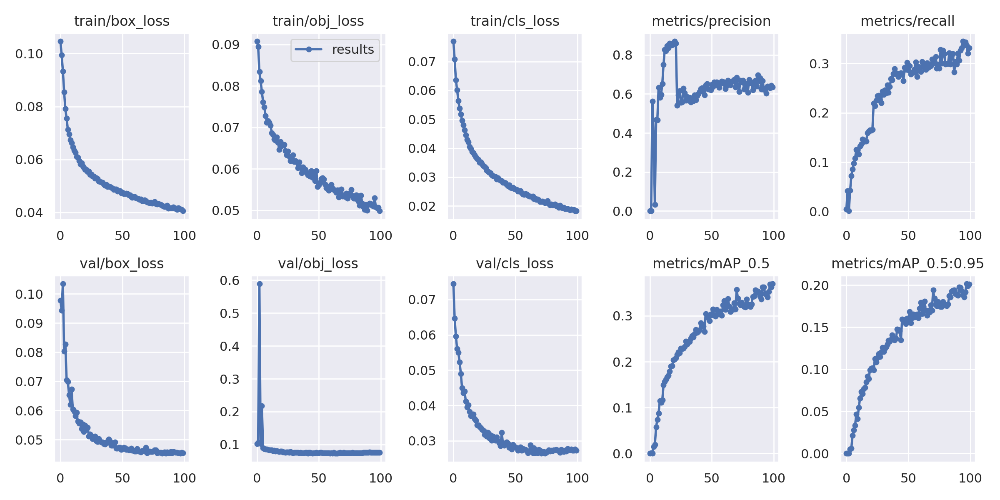

In [19]:
Image(filename='/content/yolov5/runs/train/trafic_data_results/results.png', width=1000)

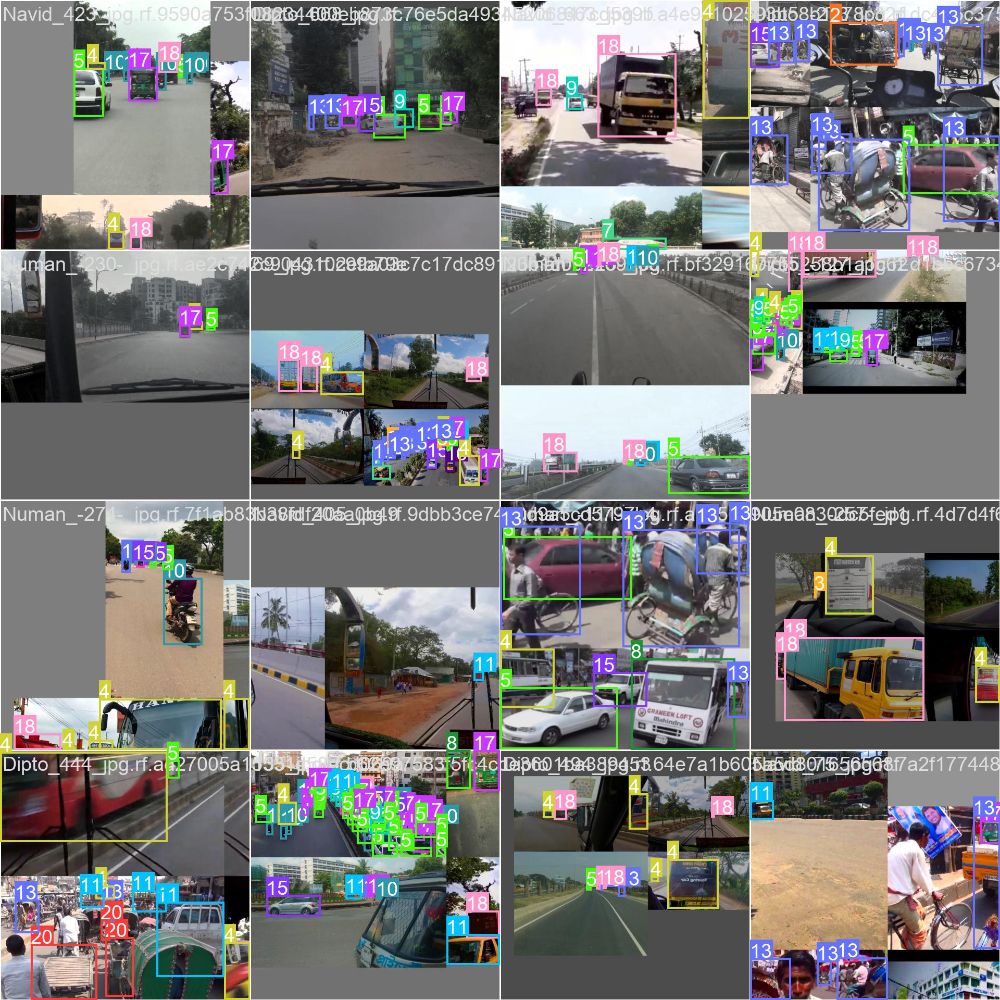

In [20]:
Image(filename='/content/yolov5/runs/train/trafic_data_results/train_batch0.jpg', width=1000)

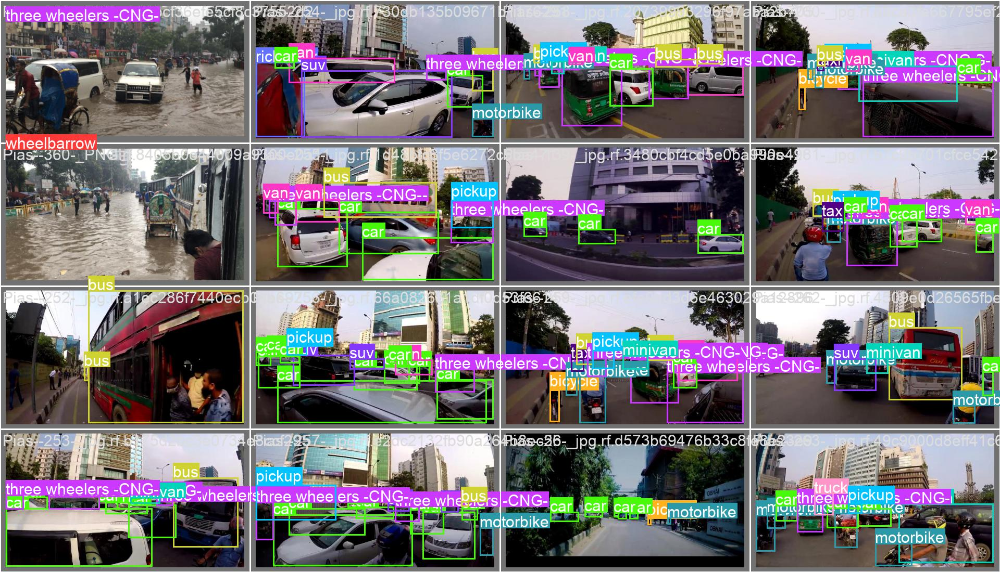

In [21]:
Image(filename='/content/yolov5/runs/train/trafic_data_results/val_batch0_labels.jpg', width=1000)

### 검증(Validation)

In [22]:
!python val.py --weights runs/train/trafic_data_results/weights/best.pt --data ./trafic_data/data_1.yaml --img 640 --iou 0.65 --half

val: data=./trafic_data/data_1.yaml, weights=['runs/train/trafic_data_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.2-239-gf33718f Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7066762 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning '/content/yolov5/trafic_data/valid/labels.cache' images and labels... 300 found, 0 missing, 0 empty, 0 corrupt: 100% 300/300 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/yolov5/trafic_data/valid/images/Pias--359-_PNG.rf.43bcf36efe5cf8c37552d2c45fffea60.jpg: 9 duplicate labels removed
val: WARNING ⚠️ /content/yolov5/trafic_data/valid/images/Pias--360-_PNG.rf.8405b0e44009a9300e0a1100ccf7d5b3.jpg: 7 duplicate labels re

In [25]:
%ls runs/train/trafic_data_results/weights

best.pt  last.pt


In [26]:
!python detect.py --weights runs/train/trafic_data_results/weights/best.pt --img 640 --conf 0.4 --source ./trafic_data/valid/images

detect: weights=['runs/train/trafic_data_results/weights/best.pt'], source=./trafic_data/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-239-gf33718f Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7066762 parameters, 0 gradients, 15.9 GFLOPs
image 1/300 /content/yolov5/trafic_data/valid/images/Pias--139-_jpg.rf.3480cbf4cd5e0ba990e49896b2a3d9aa.jpg: 384x640 3 cars, 1 suv, 18.7ms
image 2/300 /content/yolov5/trafic_data/valid/images/Pias--14-_jpg.rf.bc90f7011d8a8519dd9c8eeb3f4a5bce.jpg: 384x640 1 bicycle, 4 cars, 1 motorbike, 1 pickup, 25.9ms
image 3/300

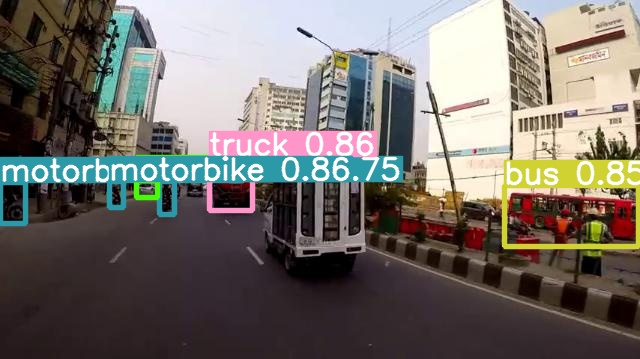

In [31]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp/*.jpg'))
display(Image(filename=image_name))

In [32]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [33]:
%mkdir /content/drive/MyDrive/trafic_data
%cp /content/yolov5/runs/train/trafic_data_results/weights/best.pt /content/drive/MyDrive/trafic_data

In [48]:
print("Torch version:{}".format(torch.__version__))
print("cuda version: {}".format(torch.version.cuda))
print("cudnn version:{}".format(torch.backends.cudnn.version()))

Torch version:1.12.1+cu113
cuda version: 11.3
cudnn version:8302


In [49]:
print(torch.__version__)

1.12.1+cu113
